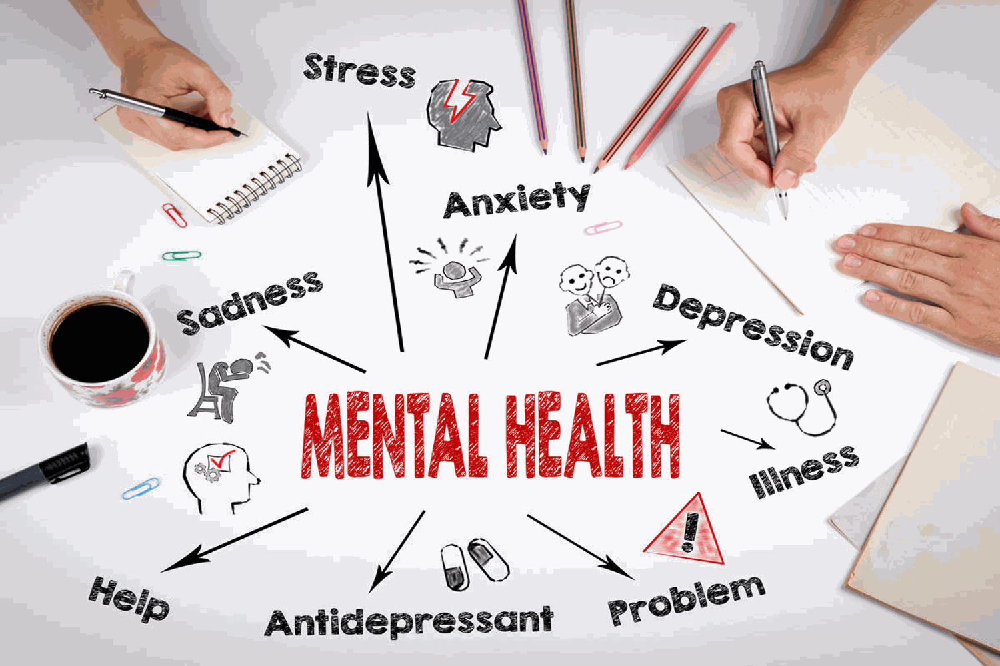

In [1]:
from PIL import Image
# Open the JPEG image
image1 = Image.open('mental-health.jpg')
# Convert the JPEG images to RGBA mode
image1 = image1.convert('RGBA')
# Set the size of the images
width, height = 1500, 1000
# Resize the images
image1 = image1.resize((width, height))
# Create a list of frames for the GIF
frames = [image1]
# Save the frames as a GIF
frames[0].save('my_gif01.gif', format='GIF', append_images=frames[1:], save_all=True, loop=0)
from IPython.display import Image
with open('my_gif01.gif','rb') as f1:
    image1 = Image(data=f1.read(), format='png')
display(image1)

### Libraries

In [2]:
import nltk

C:\Users\savla\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
import re

In [4]:
import csv

In [5]:
import pprint

In [6]:
import pandas as pd

In [7]:
import numpy as np

In [8]:
from urllib import request

In [9]:
from bs4 import BeautifulSoup

In [10]:
from nltk.corpus import stopwords

In [11]:
from nltk import FreqDist

In [12]:
from nltk import sent_tokenize, word_tokenize, PorterStemmer

In [13]:
from scipy.stats import ttest_rel

In [14]:
from sklearn.model_selection import train_test_split

In [15]:
from sklearn.feature_extraction.text import CountVectorizer

In [16]:
from sklearn.naive_bayes import MultinomialNB

In [17]:
from sklearn.metrics import accuracy_score, classification_report, plot_confusion_matrix, plot_roc_curve

In [18]:
# visualisation
import seaborn as sns

In [19]:
from matplotlib import pyplot as plt

In [20]:
import plotly.express as px

In [21]:
import plotly.graph_objects as go

In [22]:
from plotly.subplots import make_subplots

### Mental health csv file text preprocessing 

In [23]:
input_file = open('mental_health.csv', 'r')

In [24]:
text = []
for row in csv.reader(input_file):
    text.append((nltk.word_tokenize(row[0]),row[1]))

In [25]:
text = text[1:]

In [ ]:
text

In [27]:
print(len(text))

27977


In [28]:
data = {'Tokenized_Words': [item[0] for item in text],
        'Values': [item[1] for item in text]}

In [29]:
df = pd.DataFrame(data)

In [30]:
# Using describe
df.describe()

,Tokenized_Words,Values
count,27977,27977
unique,27970,2
top,"[real, suppleroot, hours, up, day, far]",0
freq,3,14139


In [31]:
# Review columns
df.columns

Index(['Tokenized_Words', 'Values'], dtype='object')

In [32]:
print(df.isnull().sum())

Tokenized_Words    0
Values             0
dtype: int64


In [33]:
df = pd.DataFrame(text, columns=['tokenized_words', 'label'])

In [34]:
print(df['label'].value_counts())

0    14139
1    13838
Name: label, dtype: int64


In [35]:
data = {
    'Label': ["Non-mental-health", "Mental-health"],
    'Label Encoded': [0,1]
}

In [36]:
dr = pd.DataFrame(data)

In [37]:
dr

,Label,Label Encoded
0,Non-mental-health,0
1,Mental-health,1


In [38]:
stopWords = nltk.corpus.stopwords.words('english')
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\savla\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [39]:
def preprocess(text):
    wnl = nltk.WordNetLemmatizer()
    return [wnl.lemmatize(w.lower()) for w in text if w.lower() not in stopWords]

In [40]:
clean_text = [(preprocess(chat),label) for (chat,label) in text if len(chat) != 0] #preprocess amd remove null values

In [ ]:
clean_text

In [42]:
print(len(clean_text))

27975


In [43]:
pos_sents= [words for (words,label) in clean_text if label == '0']

In [ ]:
pos_sents

In [45]:
neg_sents= [words for (words,label) in clean_text if label == '1']

In [ ]:
neg_sents

In [47]:
print(len(pos_sents))

14138


In [48]:
print(len(neg_sents))

13837


In [49]:
pos_words = [w for (words,label) in clean_text for w in words if label == '0']

In [ ]:
pos_words

In [51]:
neg_words = [w for (words,label) in clean_text for w in words if label == '1']

In [ ]:
neg_words

In [53]:
df = pd.DataFrame(clean_text, columns=['Tokenized Text', 'Label'])

In [54]:
pd.set_option('display.max_colwidth', None)

In [55]:
df.head(51)

,Tokenized Text,Label
0,"[dear, american, teen, question, dutch, person, heard, guy, get, way, easier, thing, learn, age, u, sooooo, thth, grader, like, right, guy, learn, math]",0
1,"[nothing, look, forward, lifei, dont, many, reason, keep, going, feel, like, nothing, keep, going, next, day, make, want, hang]",1
2,"[music, recommendation, im, looking, expand, playlist, usual, genre, alt, pop, minnesota, hip, hop, steampunk, various, indie, genre, artist, people, like, cavetown, aliceband, bug, hunter, penelope, scott, various, rhymesayers, willing, explore, new, genresartists, anything, generic, rap, type, exclusively, sex, drug, cool, rapper, rap, type, pretty, good, pop, popular, couple, year, ago, dunno, technical, genre, name, anyways, anyone, got, music, recommendation, favorite, artistssongs]",0
3,"[im, done, trying, feel, betterthe, reason, im, still, alive, know, mum, devastated, ever, killed, ever, pass, im, still, state, im, going, hesitate, ending, life, shortly, im, almost, take, med, go, therapy, nothing, seems, help, enough, dont, want, around, anymore, hate, feeling, like, wouldnt, wish, upon, enemy, brain, feel, like, constantly, like, static, tv, wont, shut, overthinking, think, im, running, option, dont, see, living, past, got, accepted, health, science, degree, dont, even, know, wan, na, try, know, im, smart, mental, illness, hold, back, think, cant, anything, im, good, enough, need, fucking, help, dont, know, anymore, ive, run, option]",1
4,"[worried, year, old, girl, subject, domestic, physicalmental, housewithout, going, lot, know, girl, know, girl, etc, let, give, brief, background, known, girl, year, life, uk, live, different, country, kept, touch, electronic, mean, first, girl, schizophrenic, host, illness, dad, severe, anger, issue, abuse, physically, mentally, make, serve, food, wash, dish, clean, house, shout, beat, petty, thing, like, spilling, water, picking, toy, floor, threatened, knife, beat, plate, glass, punch, head, last, time, got, beat, around, month, ago, one, sibling, get, beat, tried, tell, mother, beating, showed, bruise, mother, refuse, believe, even, laughed, probably, fear, confronting, husband, yell, wife, family, treat, well, either, sister, ...]",1
5,"[hey, rredflag, sure, right, place, post, go, im, currently, student, intern, sandia, national, lab, working, survey, help, improve, marketing, outreach, effort, many, school, recruit, around, country, looking, current, undergradgrad, stem, student, stem, student, know, stem, student, would, greatly, appreciate, help, take, pas, along, short, survey, thank, everyone, help, take, survey, entered, drawing, chance, win, one, three, amazon, gc]",1
6,"[feel, like, someone, need, hear, tonight, feeling, right, think, cant, anything, people, keep, puting, listen, life, everyone, else, living, someone, tell, unable, something, work, get, done, say, wrong, someone, say, youl, never, make, work, hard, make, end, one, make, could, make, putting, people, like, see, life, nobody, tell, cant, one, tell, live, love, look, end, let, climb, height, hope, someone, needed, hear, tonight, beutiful, life, good, night, sincerely, austin, zippy]",0
7,"[deserve, liveif, died, right, noone, would, carei, real, friendsi, always, start, conversation, get, dry, response, feel, comfortable, around, female, emotional, abuse, mom, put, left, usi, never, find, love, keep, getting, reminded, everyday, failure, disappointment, parent, compared, siblingsi, first, suicidal, thought, afraid, grade, good, enough, parent, probably, end, soon]",1
8,"[feel, good, ive, set, dateim, killing, friday, nice, finally, know, im, gon, na, bye]",1
9,"[live, guiltok, made, stupid, random, choice, getting, basically, molested, relative, super, erratic, thing, haunting, right, random, walk, home, randomly, assaulted, classmate, screamed, name, loud, pretty, much, annoying, asshole, everything, could, torment, later, excluded, excluded, well, none, mattered, later, went, bunch, horrib

# Text Statistics

### Counts and Lexical Diversity

In [56]:
#num of sentences
len_pos_sents = len(pos_sents)

In [57]:
print("Count of Positive Texts:",len_pos_sents)

Count of Positive Texts: 14138


In [58]:
len_neg_sents = len(neg_sents)

In [59]:
print("Count of Negative Texts:", len_neg_sents)

Count of Negative Texts: 13837


In [60]:
#average length of words
#count of words,vocab size, lexical diversity
def lexical_diversity(my_text_data):
    word_count = len(my_text_data)
    vocab_size = len(set(my_text_data))
    diversity_score = vocab_size / word_count
    return word_count,vocab_size, diversity_score

In [61]:
word_count_pos, vocab_size_pos, diversity_score_pos = lexical_diversity(pos_words)

In [62]:
word_count_neg,vocab_size_neg, diversity_score_neg = lexical_diversity(neg_words)

In [63]:
avg_text_length_pos = word_count_pos/len_pos_sents

In [64]:
print("Average Length of Positive Texts:",avg_text_length_pos)

Average Length of Positive Texts: 45.62363842127599


In [65]:
avg_text_length_neg = word_count_neg/len_neg_sents

In [66]:
print("Average Length of Negative Texts:",avg_text_length_neg)

Average Length of Negative Texts: 91.43253595432536


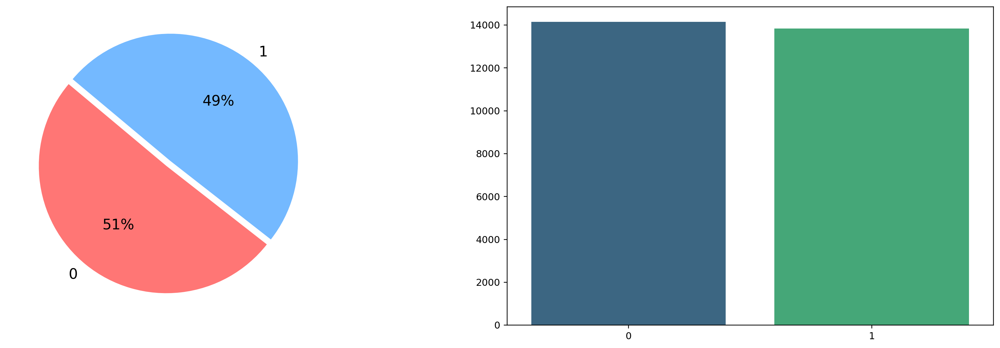

In [67]:
labels = [label for _, label in clean_text]
sizes = [labels.count('0'), labels.count('1')]
custom_colours = ['#ff7675', '#74b9ff']

plt.figure(figsize=(20, 6), dpi=227)

plt.subplot(1, 2, 1)
plt.pie(sizes, labels=['0', '1'], textprops={'fontsize': 15}, startangle=140, autopct='%1.0f%%', colors=custom_colours, explode=[0, 0.05])

plt.subplot(1, 2, 2)
sns.barplot(x=['0', '1'], y=sizes, palette='viridis')

plt.show()

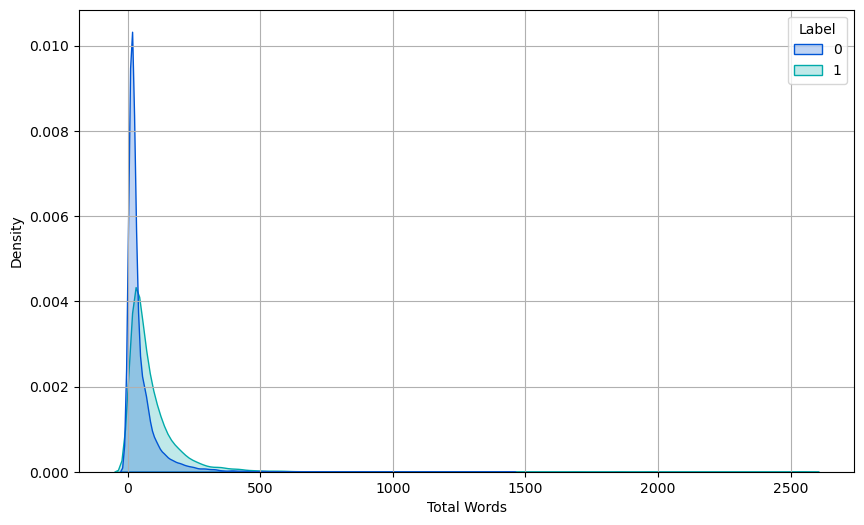

In [68]:
total_words = [len(words) for words, _ in clean_text]
labels = [label for _, label in clean_text]  # Use clean_text instead of text
data = pd.DataFrame({'Total Words': total_words, 'Label': labels})
plt.figure(figsize=(10, 6))
tw=sns.kdeplot(x=data['Total Words'], hue=data['Label'], palette='winter', shade=True)
tw.grid(True)
plt.show()

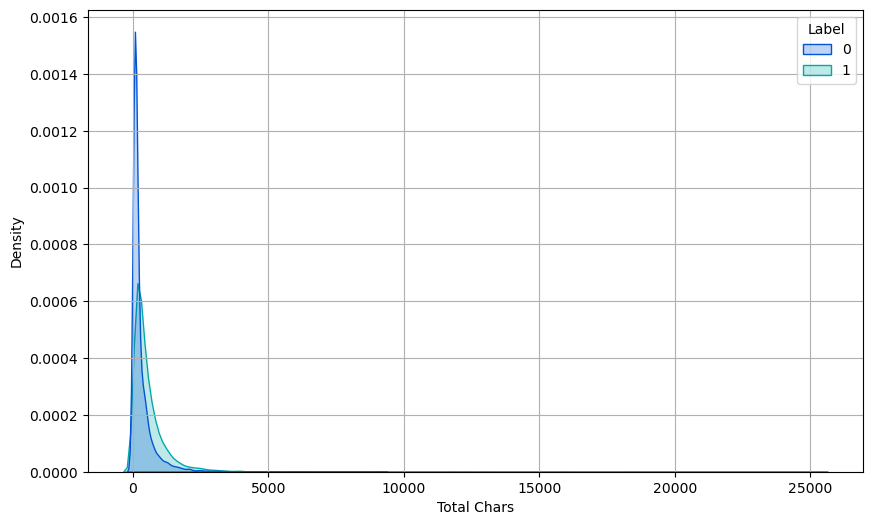

In [69]:
total_chars = [len(' '.join(words)) for words, _ in clean_text]
labels = [label for _, label in clean_text]
data = pd.DataFrame({'Total Chars': total_chars, 'Label': labels})
plt.figure(figsize=(10, 6))
ax=sns.kdeplot(x=data['Total Chars'], hue=data['Label'], palette='winter', shade=True)
ax.grid(True)
plt.show()

In [70]:
from tabulate import tabulate

In [71]:
#make this into a table
print("Word Count in Positive Texts:",word_count_pos, "\nVocabulary Size of Positive Texts:",vocab_size_pos, "\nLexical Diversity of Positive Texts:", diversity_score_pos)
print("Word Count in Negative Texts:",word_count_neg, "\nVocabulary Size of Negative Texts:",vocab_size_neg, "\nLexical Diversity of Negative Texts:",diversity_score_neg)

Word Count in Positive Texts: 645027 
Vocabulary Size of Positive Texts: 44417 
Lexical Diversity of Positive Texts: 0.06886068335123956
Word Count in Negative Texts: 1265152 
Vocabulary Size of Negative Texts: 38793 
Lexical Diversity of Negative Texts: 0.030662718787940104


In [72]:
positive_data = [
    ["Word Count", word_count_pos],
    ["Vocabulary Size", vocab_size_pos],
    ["Lexical Diversity", diversity_score_pos]
]

In [73]:
# Print tables
print("Positive Texts:")
print(tabulate(positive_data, headers=["Metric", "Value"], tablefmt="grid"))

Positive Texts:
+-------------------+----------------+
| Metric            |          Value |
+===================+================+
| Word Count        | 645027         |
+-------------------+----------------+
| Vocabulary Size   |  44417         |
+-------------------+----------------+
| Lexical Diversity |      0.0688607 |
+-------------------+----------------+


In [74]:
negative_data = [
    ["Word Count", word_count_neg],
    ["Vocabulary Size", vocab_size_neg],
    ["Lexical Diversity", diversity_score_neg]
]

In [75]:
print("\nNegative Texts:")
print(tabulate(negative_data, headers=["Metric", "Value"], tablefmt="grid"))


Negative Texts:
+-------------------+-----------------+
| Metric            |           Value |
+===================+=================+
| Word Count        |     1.26515e+06 |
+-------------------+-----------------+
| Vocabulary Size   | 38793           |
+-------------------+-----------------+
| Lexical Diversity |     0.0306627   |
+-------------------+-----------------+


### Top 50 Cleaned Words

In [76]:
all_words = [word for words, _ in clean_text for word in words]

In [77]:
freq_dist = FreqDist(all_words)

In [78]:
pprint.pprint(freq_dist.most_common(50))

[('im', 34720),
 ('like', 22642),
 ('want', 18505),
 ('know', 16336),
 ('feel', 16254),
 ('life', 15374),
 ('get', 14429),
 ('time', 13242),
 ('one', 13193),
 ('even', 11498),
 ('people', 11483),
 ('ive', 11287),
 ('would', 11001),
 ('friend', 10627),
 ('year', 10557),
 ('cant', 10446),
 ('really', 10187),
 ('thing', 9808),
 ('day', 9511),
 ('think', 9071),
 ('go', 8852),
 ('make', 8448),
 ('never', 8031),
 ('going', 7964),
 ('dont', 7829),
 ('much', 7546),
 ('help', 6900),
 ('good', 6818),
 ('way', 6345),
 ('see', 5998),
 ('thought', 5913),
 ('got', 5907),
 ('could', 5649),
 ('br', 5610),
 ('love', 5492),
 ('still', 5405),
 ('back', 5373),
 ('anything', 5304),
 ('someone', 5251),
 ('need', 5183),
 ('say', 5163),
 ('end', 5072),
 ('something', 4986),
 ('anymore', 4972),
 ('always', 4942),
 ('fucking', 4931),
 ('family', 4923),
 ('work', 4910),
 ('school', 4899),
 ('better', 4814)]


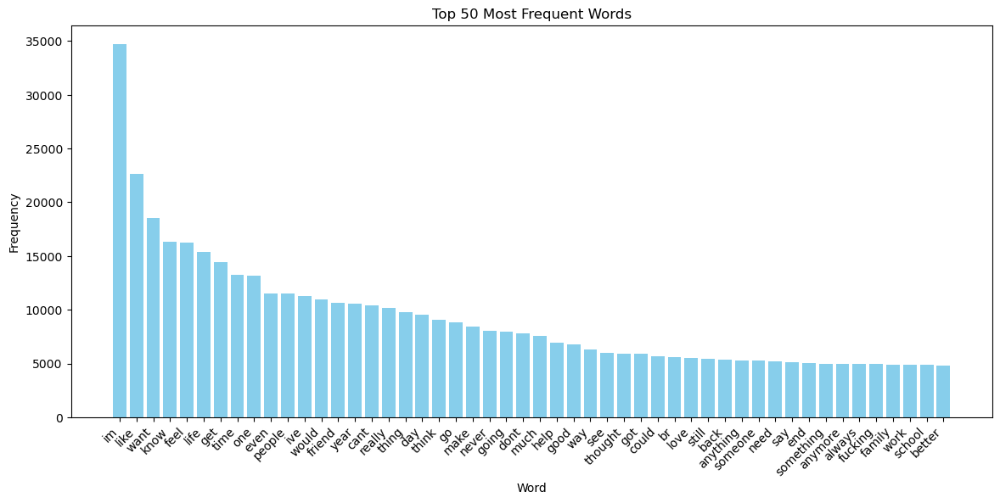

In [79]:
top_words = freq_dist.most_common(50)
words, frequencies = zip(*top_words)
plt.figure(figsize=(14, 6))
plt.bar(words, frequencies, color='skyblue')
plt.title('Top 50 Most Frequent Words')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

In [80]:
freq_dist_pos = nltk.FreqDist(pos_words)

In [81]:
freq_dist_pos.most_common(50)

[('like', 6969),
 ('im', 6676),
 ('br', 5608),
 ('one', 4801),
 ('film', 4745),
 ('movie', 4527),
 ('get', 3661),
 ('time', 3427),
 ('know', 3341),
 ('filler', 3221),
 ('people', 3133),
 ('good', 2871),
 ('really', 2852),
 ('want', 2701),
 ('day', 2648),
 ('make', 2602),
 ('friend', 2589),
 ('would', 2556),
 ('even', 2351),
 ('see', 2237),
 ('think', 2233),
 ('go', 2174),
 ('feel', 2145),
 ('thing', 2138),
 ('year', 2103),
 ('also', 2077),
 ('life', 2016),
 ('got', 1953),
 ('dont', 1872),
 ('much', 1853),
 ('love', 1830),
 ('say', 1814),
 ('guy', 1783),
 ('well', 1703),
 ('girl', 1701),
 ('first', 1700),
 ('story', 1644),
 ('never', 1613),
 ('u', 1586),
 ('great', 1577),
 ('way', 1575),
 ('school', 1569),
 ('na', 1554),
 ('ive', 1508),
 ('cant', 1505),
 ('something', 1505),
 ('character', 1481),
 ('still', 1476),
 ('going', 1403),
 ('need', 1393)]

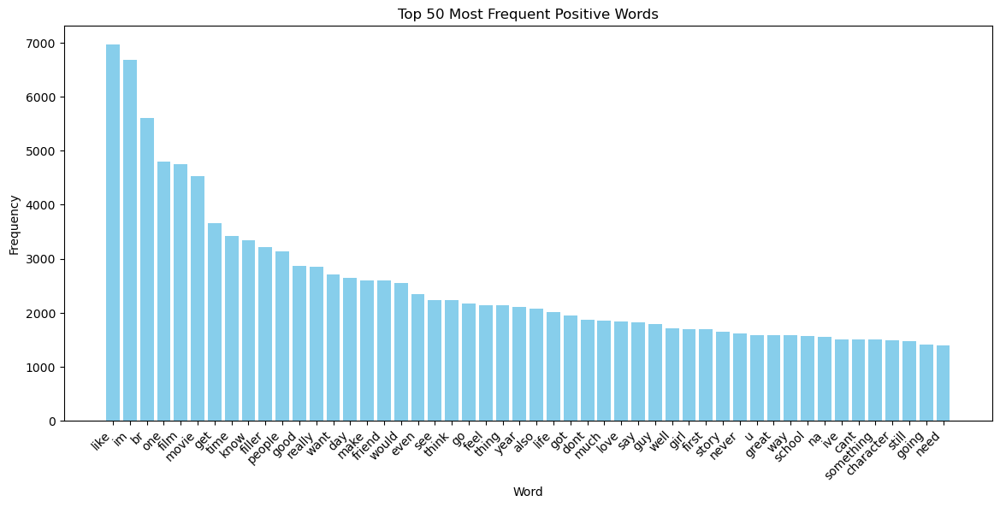

In [82]:
top_words_pos = freq_dist_pos.most_common(50)
words, frequencies = zip(*top_words_pos)
plt.figure(figsize=(14, 6))
plt.bar(words, frequencies, color='skyblue')
plt.title('Top 50 Most Frequent Positive Words')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

In [83]:
freq_dist_neg = nltk.FreqDist(neg_words)

In [84]:
freq_dist_neg.most_common(50)

[('im', 28044),
 ('want', 15804),
 ('like', 15673),
 ('feel', 14109),
 ('life', 13358),
 ('know', 12995),
 ('get', 10768),
 ('time', 9815),
 ('ive', 9779),
 ('even', 9147),
 ('cant', 8941),
 ('year', 8454),
 ('would', 8445),
 ('one', 8392),
 ('people', 8350),
 ('friend', 8038),
 ('thing', 7670),
 ('really', 7335),
 ('day', 6863),
 ('think', 6838),
 ('go', 6678),
 ('going', 6561),
 ('never', 6418),
 ('dont', 5957),
 ('make', 5846),
 ('much', 5693),
 ('help', 5546),
 ('thought', 4952),
 ('way', 4770),
 ('anymore', 4654),
 ('could', 4306),
 ('anything', 4292),
 ('family', 4197),
 ('end', 4137),
 ('fucking', 4073),
 ('everything', 4045),
 ('back', 4020),
 ('die', 4002),
 ('someone', 3980),
 ('got', 3954),
 ('good', 3947),
 ('still', 3929),
 ('nothing', 3920),
 ('always', 3907),
 ('live', 3899),
 ('better', 3892),
 ('work', 3863),
 ('kill', 3802),
 ('need', 3790),
 ('see', 3761)]

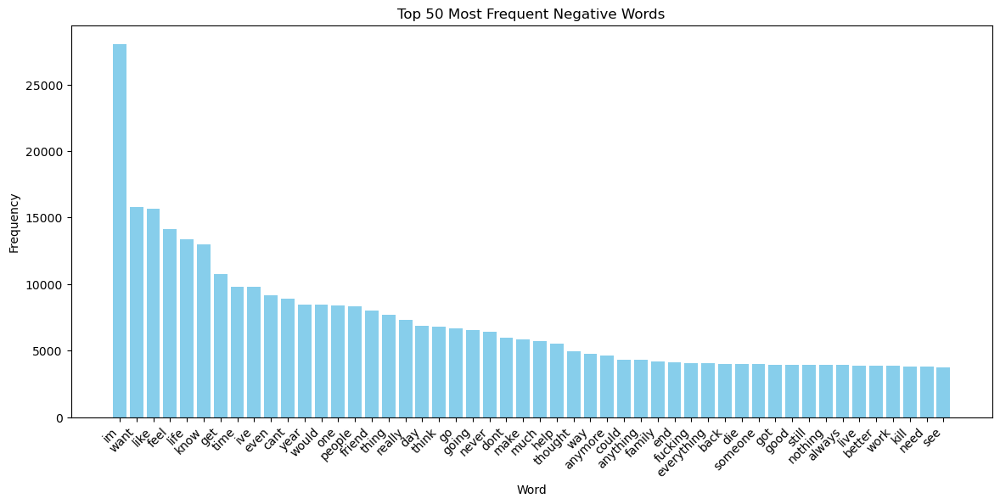

In [85]:
freq_dist_neg = freq_dist_neg.most_common(50)
words, frequencies = zip(*freq_dist_neg)
plt.figure(figsize=(14, 6))
plt.bar(words, frequencies, color='skyblue')
plt.title('Top 50 Most Frequent Negative Words')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

# Concordance

In [86]:
#check what words are surrounding some of the top 50 most common words to get a sense of what people may be discussing.
#Concern Flag
neg_words_text = nltk.Text(neg_words)
neg_words_text.concordance("nothing")

Displaying 25 of 3920 matches:
 nothing look forward lifei dont many reason
nt many reason keep going feel like nothing keep going next day make want hang 
ortly im almost take med go therapy nothing seems help enough dont want around 
like climbing mount everest achieve nothing life none want anything person smel
itive thinking reaching friend like nothing helping came back guy sorry gender 
remember always saying wait til kid nothing changed work manage finish school s
nce take alone constantly depressed nothing changed better wish people could re
le could relate situation wish best nothing changed start feeling anything bett
g went wrong fault way keep telling nothing needed apologize every day pass get
arely sleep day tldr feeling guilty nothing conditioned previously abusive rela
listen im scared please redflag way nothing else im scared im fucking scared me
urt know cant like know live friend nothing always going want think fair either
 put happy face throughout day want nothing 

In [87]:
#Concern Flag
pos_words_text = nltk.Text(pos_words)
pos_words_text.concordance("nothing")

Displaying 25 of 749 matches:
 parade extreme parody lot kid seen nothing parody short time everyone seemed i
ku realise absolutely _no one_ care nothing better eating gokus as understand y
t felt painful guess like annoyance nothing worth complaining lot congestion ac
raft one help shave better go grain nothing like literally nothing hair press f
ter go grain nothing like literally nothing hair press flat face go cut area st
l real scene almost feel heat sound nothing special music ennio morricone good 
e story film really make think fact nothing impossible lactose intolerant would
ted another year life accomplishing nothing bday dont dare say ting requirement
eone else female nice treat respect nothing else really matter finally agree ip
ace first broke nose lol blamed kid nothing bad happened action horror scifi ex
red moment drawing suck well either nothing next day try best make acceptable s
exposed character good disappointed nothing compare found enjoyment mindless id
mm female 

## Word Cloud

In [88]:
!pip install wordcloud

In [89]:
!pip install pillow

In [90]:
!pip install --upgrade pip

In [91]:
!pip install --upgrade Pillow

In [92]:
from PIL import Image

In [93]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [94]:
pos_words_str = " ".join(pos_words)

neg_words_str = " ".join(neg_words)

In [95]:
pos_words_str

'dear american teen question dutch person heard guy get way easier thing learn age u sooooo thth grader like right guy learn math music recommendation im looking expand playlist usual genre alt pop minnesota hip hop steampunk various indie genre artist people like cavetown aliceband bug hunter penelope scott various rhymesayers willing explore new genresartists anything generic rap type exclusively sex drug cool rapper rap type pretty good pop popular couple year ago dunno technical genre name anyways anyone got music recommendation favorite artistssongs feel like someone need hear tonight feeling right think cant anything people keep puting listen life everyone else living someone tell unable something work get done say wrong someone say youl never make work hard make end one make could make putting people like see life nobody tell cant one tell live love look end let climb height hope someone needed hear tonight beutiful life good night sincerely austin zippy excercise motivated ngl 

In [96]:
neg_words_str

'nothing look forward lifei dont many reason keep going feel like nothing keep going next day make want hang im done trying feel betterthe reason im still alive know mum devastated ever killed ever pass im still state im going hesitate ending life shortly im almost take med go therapy nothing seems help enough dont want around anymore hate feeling like wouldnt wish upon enemy brain feel like constantly like static tv wont shut overthinking think im running option dont see living past got accepted health science degree dont even know wan na try know im smart mental illness hold back think cant anything im good enough need fucking help dont know anymore ive run option worried year old girl subject domestic physicalmental housewithout going lot know girl know girl etc let give brief background known girl year life uk live different country kept touch electronic mean first girl schizophrenic host illness dad severe anger issue abuse physically mentally make serve food wash dish clean house

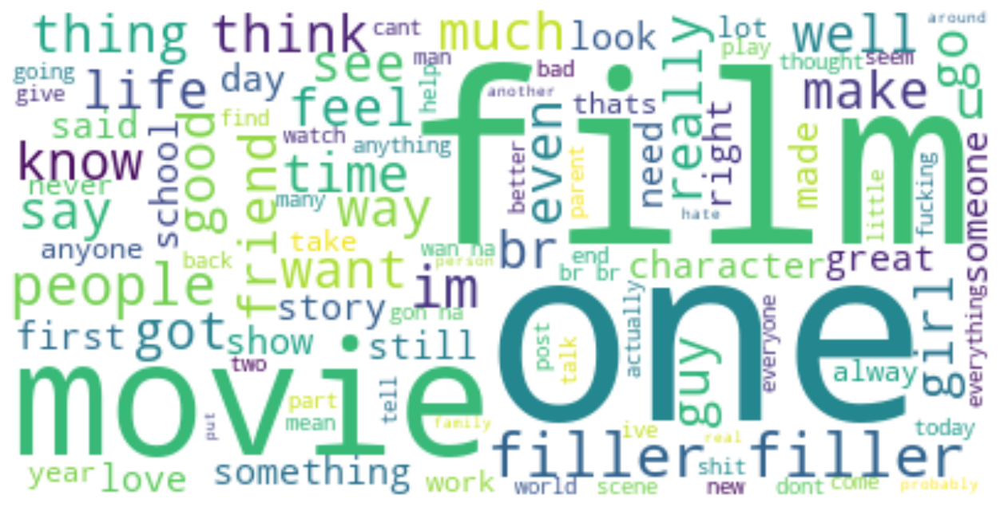

In [97]:
plt.figure(figsize=(16, 8))
# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=100, max_words=100, background_color="white").generate(pos_words_str)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

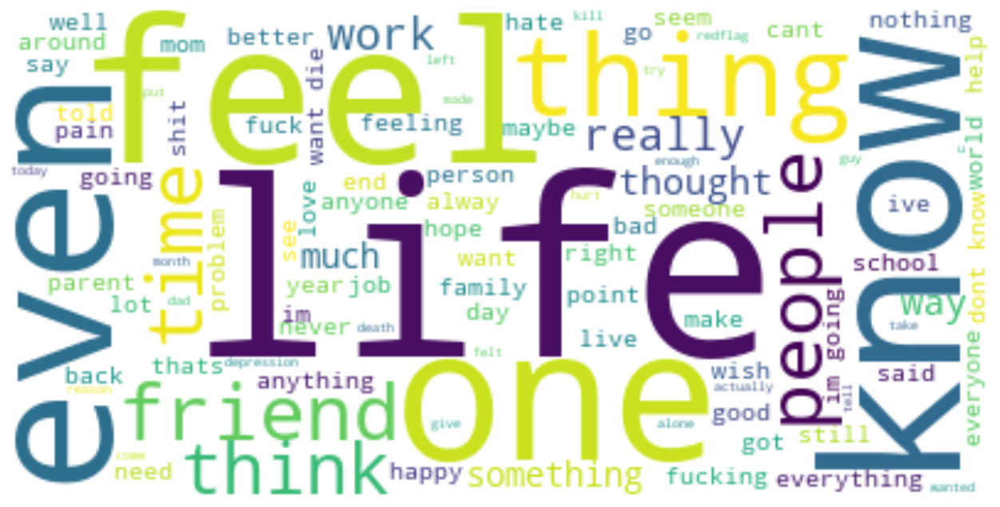

In [98]:
plt.figure(figsize=(16, 8))
# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=100, max_words=100, background_color="white").generate(neg_words_str)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Text Summarization

In [99]:
import math

In [100]:
def _create_frequency_matrix(sentences):
    frequency_matrix = {}
    #stopWords = set(stopwords.words("english"))
    #ps = PorterStemmer()
    for sent in sentences:
        freq_table = {}
        for word in sent:
            #word = word.lower()
            #word = ps.stem(word)
            if word in stopWords:
                continue
            if word in freq_table:
                freq_table[word] += 1
            else:
                freq_table[word] = 1
        frequency_matrix[" ".join(sent[:3])] = freq_table
    return frequency_matrix

In [101]:
def _create_tf_matrix(freq_matrix):
    tf_matrix = {}
    for sent, f_table in freq_matrix.items():
        tf_table = {}
        count_words_in_sentence = len(f_table)
        for word, count in f_table.items():
            tf_table[word] = count / count_words_in_sentence
        tf_matrix[sent] = tf_table
    return tf_matrix

In [102]:
def _create_documents_per_words(freq_matrix):
    word_per_doc_table = {}
    for sent, f_table in freq_matrix.items():
        for word, count in f_table.items():
            if word in word_per_doc_table:
                word_per_doc_table[word] += 1
            else:
                word_per_doc_table[word] = 1
    return word_per_doc_table

In [103]:
def _create_idf_matrix(freq_matrix, count_doc_per_words, total_documents):
    idf_matrix = {}
    for sent, f_table in freq_matrix.items():
        idf_table = {}
        for word in f_table.keys():
            idf_table[word] = math.log10(total_documents / float(count_doc_per_words[word]))
        idf_matrix[sent] = idf_table
    return idf_matrix

In [104]:
def _create_tf_idf_matrix(tf_matrix, idf_matrix):
    tf_idf_matrix = {}
    for (sent1, f_table1), (sent2, f_table2) in zip(tf_matrix.items(), idf_matrix.items()):
        tf_idf_table = {}
        for (word1, value1), (word2, value2) in zip(f_table1.items(),
                                                    f_table2.items()):  # here, keys are the same in both the table
            tf_idf_table[word1] = float(value1 * value2)
        tf_idf_matrix[sent1] = tf_idf_table
    return tf_idf_matrix

In [105]:
def _score_sentences(tf_idf_matrix) -> dict:
    """
    score a sentence by its word's TF
    Basic algorithm: adding the TF frequency of every non-stop word in a sentence divided by total no of words in a sentence.
    :rtype: dict
    """
    sentenceValue = {}
    for sent, f_table in tf_idf_matrix.items():
        total_score_per_sentence = 0
        count_words_in_sentence = len(f_table)
        for word, score in f_table.items():
            total_score_per_sentence += score
        sentenceValue[sent] = total_score_per_sentence / count_words_in_sentence
    return sentenceValue

In [106]:
def _find_average_score(sentenceValue) -> int:
    """
    Find the average score from the sentence value dictionary
    :rtype: int
    """
    sumValues = 0
    for entry in sentenceValue:
        sumValues += sentenceValue[entry]
    # Average value of a sentence from original summary_text
    average = (sumValues / len(sentenceValue))
    return average

In [107]:
def _generate_summary(sentences, sentenceValue, threshold):
    sentence_count = 0
    summary = ''
    for sentence in sentences:
        if sentence[:15] in sentenceValue and sentenceValue[sentence[:15]] >= (threshold):
            summary += " " + sentence
            sentence_count += 1
    return summary

In [108]:
pos_freq_matrix = _create_frequency_matrix(pos_sents)

In [109]:
pos_tf_matrix = _create_tf_matrix(pos_freq_matrix)  # Use pos_freq_matrix here

In [110]:
pos_count_doc_per_words = _create_documents_per_words(pos_freq_matrix)  # Use pos_freq_matrix here

In [111]:
pos_idf_matrix = _create_idf_matrix(pos_freq_matrix, pos_count_doc_per_words, len_pos_sents)  # Use pos_freq_matrix here

In [112]:
pos_tf_idf_matrix = _create_tf_idf_matrix(pos_tf_matrix, pos_idf_matrix)  # Use pos_tf_matrix and pos_idf_matrix here

In [113]:
pos_sentence_scores = _score_sentences(pos_tf_idf_matrix)  # Use pos_tf_idf_matrix here

In [114]:
pos_threshold = _find_average_score(pos_sentence_scores)  # Use pos_sentence_scores here

In [115]:
pos_sents_string = []
for sent in pos_sents:
    pos_sents_string.append(' '.join(sent))

In [116]:
pos_summary = _generate_summary(pos_sents_string, pos_sentence_scores, pos_threshold)

In [117]:
print(pos_summary)

 eat decide hate bryce hall wanted make clear bye cut nail rubbed hand lotion feel smooth fish seggs like bloop britney stop moving much bloop bloop hey hows day guy think karma real filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler filler hey guess didnt sex neither cant give start ya bestselling teenage rebellion beluga whale as wake one morning find beluga whale stuck as going went bedroom uh played minecraft sleep turned guy bye lady look cuter wearing mask properly guy female make karma whore two minute till worrkkkk bye good film funny yet film good ernest film okay im bored call man carrot head stew edward cat feed hngrs internet point _ _ soo bored bored lying bed pondering life posting ara ara forget day ara ara hey babe esex burger patty co meat bun karent thigh thicc tho filler text filler text filler text filler text filler text like voice nice httpsopenspotifycomtrackprkmhypzzv

In [118]:
neg_freq_matrix = _create_frequency_matrix(neg_sents)

In [119]:
neg_tf_matrix = _create_tf_matrix(neg_freq_matrix)  # Use neg_freq_matrix here

In [120]:
neg_count_doc_per_words = _create_documents_per_words(neg_freq_matrix)  # Use neg_freq_matrix here

In [121]:
neg_idf_matrix = _create_idf_matrix(neg_freq_matrix, neg_count_doc_per_words, len_neg_sents)  # Use neg_freq_matrix here

In [122]:
neg_tf_idf_matrix = _create_tf_idf_matrix(neg_tf_matrix, neg_idf_matrix)  # Use neg_tf_matrix and neg_idf_matrix here

In [123]:
neg_sentence_scores = _score_sentences(neg_tf_idf_matrix)  # Use neg_tf_idf_matrix here

In [124]:
neg_threshold = _find_average_score(neg_sentence_scores)  # Use neg_sentence_scores here

In [125]:
neg_sents_string = []
for sent in neg_sents:
    neg_sents_string.append(' '.join(sent))

In [126]:
neg_summary = _generate_summary(neg_sents_string, neg_sentence_scores, neg_threshold)

In [127]:
print(neg_summary)

 tried put sugar coffee back spoon happy monday everyonestay safe sunflower one day bad memory keep playing headover thought slept hour want relapse stop thinking abt got raped everytbint bad parente abuse hooked drug going kill fear hell thing stopping mei dont understand god make u depressed much pain ask pain end punished eternally burning fucking unfair give upim tired pain hurt im tired failure im tired alone scared im tired living kicked downccc thank feel free send message need someone talk toplease jump dayi stood top bridge climb jump friend go dont dint want framed murder fill paper work seeing wow thanks dont jump need friend need dont stay popular well ididnt ask get made ididnt ask torn apartand put back together andturned somelittlemonster sucker pain saved life dont know feeltoday called police attempted redflag really know feel texting family hate u worry stop forever know feel almost today im going try againim going die soon finally ill peace im still aliveim going kil

### Classification

In [128]:
import random

In [129]:
random.seed(2)

In [130]:
random.shuffle(clean_text)

In [131]:
all_words = pos_words + neg_words

In [132]:
all_words_fd = nltk.FreqDist(all_words)

In [133]:
word_features=list(all_words_fd)[:1000]

In [134]:
def document_features(document): #2
    document_words = set(document) #3
    features = {}
    for word in word_features:
        features['contains({})'.format(word)] = (word in document_words)
    return features

In [135]:
featuresets = [(document_features(text), label) for (text,label) in clean_text]

In [136]:
size = int(len(featuresets) * 0.08)

In [137]:
train_set, test_set = featuresets[size:], featuresets[:size]

In [138]:
classifier = nltk.NaiveBayesClassifier.train(train_set)

In [139]:
print(nltk.classify.accuracy(classifier, test_set))

0.7680965147453083


In [140]:
classifier.show_most_informative_features(20)

Most Informative Features
            contains(br) = True                0 : 1      =    522.9 : 1.0
           contains(dvd) = True                0 : 1      =    138.3 : 1.0
    contains(medication) = True                1 : 0      =     56.3 : 1.0
          contains(plot) = True                0 : 1      =     54.8 : 1.0
          contains(film) = True                0 : 1      =     52.3 : 1.0
         contains(actor) = True                0 : 1      =     46.3 : 1.0
          contains(pill) = True                1 : 0      =     44.2 : 1.0
        contains(filler) = True                0 : 1      =     43.3 : 1.0
      contains(suicidal) = True                1 : 0      =     33.5 : 1.0
       contains(redflag) = True                1 : 0      =     33.0 : 1.0
        contains(comedy) = True                0 : 1      =     28.7 : 1.0
  contains(psychiatrist) = True                1 : 0      =     27.0 : 1.0
     contains(miserable) = True                1 : 0      =     24.4 : 1.0

In [ ]:
tree_classifier = nltk.DecisionTreeClassifier.train(train_set)

In [ ]:
nltk.classify.accuracy(tree_classifier, test_set)

In [ ]:
max_classifier = nltk.MaxentClassifier.train(train_set)

In [ ]:
nltk.classify.accuracy(max_classifier, test_set)

# Other Classifiers
Testing out additional classification models to try to attain higher accuracy levels. 

In [142]:
X = [' '.join(words) for words, _ in clean_text]

In [143]:
y = [label for _, label in clean_text]

In [144]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [145]:
y_train = list(map(int, y_train))

In [146]:
y_test = list(map(int, y_test))

In [147]:
#create term document matrix
vectorizer = CountVectorizer()

In [148]:
#create tf-idf
X_train_vectorized = vectorizer.fit_transform(X_train)

In [149]:
X_test_vectorized = vectorizer.transform(X_test)

In [150]:
#create Naive Bayes classification model with tf-idf matrix
classifier_NB = MultinomialNB()
classifier_NB.fit(X_train_vectorized, y_train)

MultinomialNB()

In [151]:
#predict y-values of test data based on model
y_pred_NB = classifier_NB.predict(X_test_vectorized)

In [152]:
y_prob_NB = classifier_NB.predict_proba(X_test_vectorized)[:, 1]

In [153]:
#print accuracy scores
print(accuracy_score(y_test, y_pred_NB))

0.8431022158684774


In [154]:
print(classification_report(y_test, y_pred_NB, zero_division=1))

              precision    recall  f1-score   support

           0       0.98      0.70      0.82      1399
           1       0.77      0.98      0.86      1399

    accuracy                           0.84      2798
   macro avg       0.87      0.84      0.84      2798
weighted avg       0.87      0.84      0.84      2798



In [155]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [156]:
from sklearn.ensemble import RandomForestClassifier

In [157]:
from sklearn.model_selection import train_test_split

In [158]:
from sklearn.metrics import accuracy_score

In [159]:
X_train_text, X_test_text, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [160]:
# Use TF-IDF to convert text to numerical features
vectorizer = TfidfVectorizer()

In [161]:
X_train_vectorized = vectorizer.fit_transform(X_train_text)

In [162]:
X_test_vectorized = vectorizer.transform(X_test_text)

In [163]:
classifier = RandomForestClassifier()

In [164]:
classifier.fit(X_train_vectorized, y_train)

RandomForestClassifier()

In [165]:
y_pred = classifier.predict(X_test_vectorized)

In [166]:
accuracy = accuracy_score(y_test, y_pred)

In [167]:
print("Accuracy:", accuracy)

Accuracy: 0.8899213724088635


C:\Users\savla\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


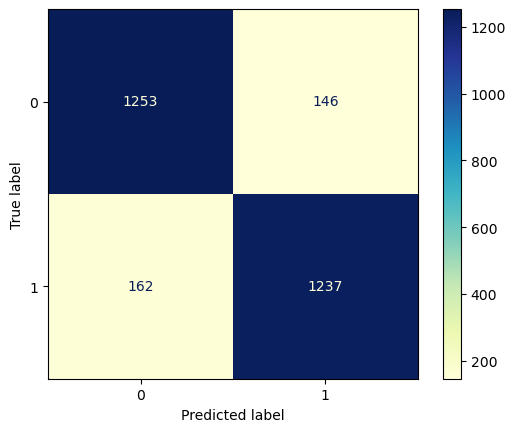

In [168]:
classes = ['0', '1']
unique_labels = set(y_test)
if 'label' in unique_labels:
    unique_labels.remove('label')

plot_confusion_matrix(classifier, X_test_vectorized, y_test, cmap='YlGnBu', display_labels=classes, labels=list(unique_labels))
plt.show()

In [169]:
import math

In [170]:
# --- Random Forest ---
#calculate the max number of features
m = int(math.sqrt(len(vectorizer.vocabulary_)))

In [171]:
# Train a Random Forest classifier
clf_rf = RandomForestClassifier(criterion = 'entropy', max_features = m,  n_estimators=300, random_state=42)

In [172]:
clf_rf.fit(X_train_vectorized, y_train)

RandomForestClassifier(criterion='entropy', max_features=250, n_estimators=300,
                       random_state=42)

In [173]:
#predict y-values of test data based on model
y_pred_rfc = clf_rf.predict(X_test_vectorized)

In [174]:
y_prob_rfc = clf_rf.predict_proba(X_test_vectorized)[:, 1]

In [175]:
#print accuracy scores
print(accuracy_score(y_test, y_pred_rfc))

0.8970693352394568


In [176]:
print(classification_report(y_test, y_pred_rfc, zero_division=1))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1399
           1       0.89      0.90      0.90      1399

    accuracy                           0.90      2798
   macro avg       0.90      0.90      0.90      2798
weighted avg       0.90      0.90      0.90      2798



C:\Users\savla\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


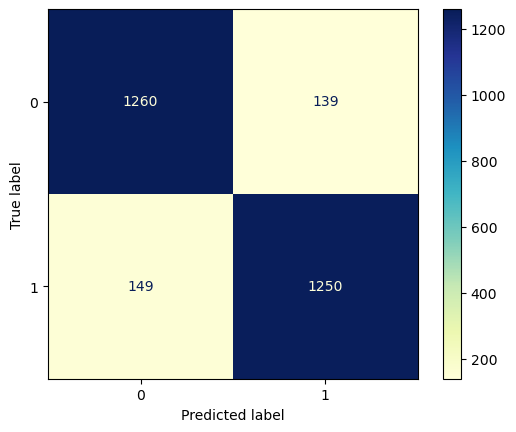

In [177]:
plot_confusion_matrix(clf_rf, X_test_vectorized, y_test, cmap='YlGnBu', display_labels=classes, labels=list(unique_labels))

In [178]:
plt.show()

In [179]:
from sklearn.linear_model import LogisticRegression

In [180]:
logistic_model = LogisticRegression(C = 0.001, solver='saga', max_iter=1000)

In [181]:
logistic_model.fit(X_train_vectorized,y_train)

LogisticRegression(C=0.001, max_iter=1000, solver='saga')

In [182]:
y_pred_lm = logistic_model.predict(X_test_vectorized)

In [183]:
y_prob_lm = logistic_model.predict_proba(X_test_vectorized)[:, 1]

In [184]:
#print accuracy scores
print(accuracy_score(y_test, y_pred_lm))

0.8252323087919943


In [185]:
print(classification_report(y_test, y_pred_lm, zero_division=1))

              precision    recall  f1-score   support

           0       0.77      0.93      0.84      1399
           1       0.91      0.72      0.80      1399

    accuracy                           0.83      2798
   macro avg       0.84      0.83      0.82      2798
weighted avg       0.84      0.83      0.82      2798



C:\Users\savla\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


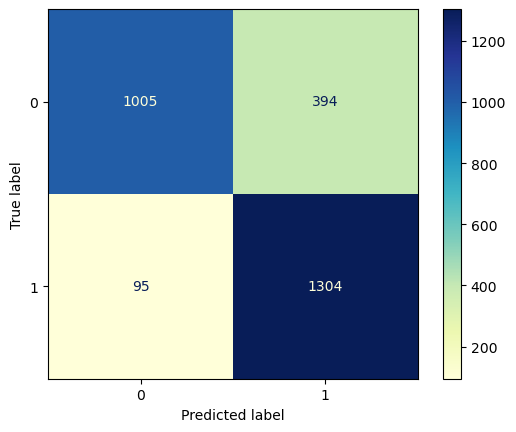

In [186]:
plot_confusion_matrix(logistic_model, X_test_vectorized, y_test, cmap='YlGnBu', display_labels=classes, labels=list(unique_labels))

In [187]:
plt.show()

In [188]:
from sklearn.ensemble import GradientBoostingClassifier

In [189]:
# Train a Gradient Boosting classifier
clf_gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

In [190]:
clf_gb.fit(X_train_vectorized, y_train)

GradientBoostingClassifier(random_state=42)

In [191]:
#predict y-values of test data based on model
y_pred_gb = clf_gb.predict(X_test_vectorized)

In [192]:
y_prob_gb = clf_gb.predict_proba(X_test_vectorized)[:, 1]

In [193]:
#print accuracy scores
print(accuracy_score(y_test, y_pred_gb))

0.870264474624732


In [194]:
print(classification_report(y_test, y_pred_gb, zero_division=1))

              precision    recall  f1-score   support

           0       0.84      0.91      0.88      1399
           1       0.90      0.83      0.86      1399

    accuracy                           0.87      2798
   macro avg       0.87      0.87      0.87      2798
weighted avg       0.87      0.87      0.87      2798



C:\Users\savla\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


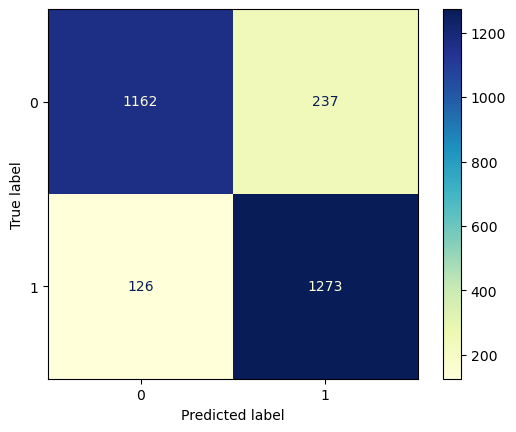

In [195]:
plot_confusion_matrix(clf_gb, X_test_vectorized, y_test, cmap='YlGnBu', display_labels=classes, labels=list(unique_labels))

In [196]:
plt.show()

In [197]:
!pip install PrettyTable

In [198]:
from sklearn.metrics import roc_curve, auc, accuracy_score
import numpy as np

In [199]:
def calculate_train_test_error(model, X_train, X_test, y_train, y_test):
    # Convert string labels to integers
    y_train = np.array(y_train, dtype=int)
    y_test = np.array(y_test, dtype=int)
    # Predict probabilities for train and test sets
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    # Compute AUC for train and test sets
    train_auc = auc(*roc_curve(y_train, y_train_pred_proba)[:2])
    test_auc = auc(*roc_curve(y_test, y_test_pred_proba)[:2])
    # Compute errors for train and test sets
    train_error = 1.0 - accuracy_score(y_train, model.predict(X_train))
    test_error = 1.0 - accuracy_score(y_test, model.predict(X_test))
    return round(train_error, 2), round(test_error, 2), round(train_auc, 2), round(test_auc, 2)

In [200]:
# Assuming classifier_NB, clf_rf, logistic_model, clf_gb are trained models
train_err_NB, test_err_NB, train_auc_NB, test_auc_NB = calculate_train_test_error(classifier_NB, X_train_vectorized, X_test_vectorized, y_train, y_test)
train_err_rf, test_err_rf, train_auc_rf, test_auc_rf = calculate_train_test_error(clf_rf, X_train_vectorized, X_test_vectorized, y_train, y_test)
train_err_log, test_err_log, train_auc_log, test_auc_log = calculate_train_test_error(logistic_model, X_train_vectorized, X_test_vectorized, y_train, y_test)
train_err_gb, test_err_gb, train_auc_gb, test_auc_gb = calculate_train_test_error(clf_gb, X_train_vectorized, X_test_vectorized, y_train, y_test)

In [201]:
from prettytable import PrettyTable

In [202]:
error_table = PrettyTable(['','NaiveBayes', 'Random Forest','Logistic Regression', 'Gradient Boost'])

In [203]:
error_table.add_row(['Train Error', train_err_NB,train_err_rf,train_err_log,train_err_gb])

In [204]:
error_table.add_row(['Test Error', test_err_NB,test_err_rf,test_err_log,test_err_gb])

In [205]:
print(error_table)

+-------------+------------+---------------+---------------------+----------------+
|             | NaiveBayes | Random Forest | Logistic Regression | Gradient Boost |
+-------------+------------+---------------+---------------------+----------------+
| Train Error |    0.08    |      1.0      |         1.0         |      1.0       |
|  Test Error |    0.12    |      1.0      |         1.0         |      1.0       |
+-------------+------------+---------------+---------------------+----------------+


In [206]:
# Replace these values with the actual performance metrics for each classifier
classifiers = ['NaiveBayes', 'Random Forest', 'Logistic Regression', 'Gradient Boost']
train_errors = [0.08, 1.0, 1.0, 1.0]
test_errors = [0.12, 1.0, 1.0, 1.0]

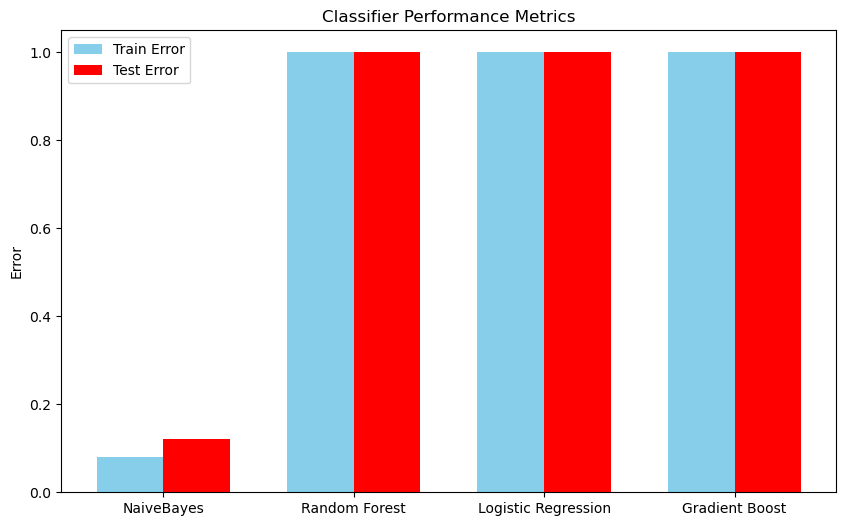

In [207]:
# Bar width
bar_width = 0.35
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
# Bar positions
train_bar_positions = range(len(classifiers))
test_bar_positions = [pos + bar_width for pos in train_bar_positions]
# Plot training errors with sky blue color
ax.bar(train_bar_positions, train_errors, width=bar_width, label='Train Error', color='skyblue')
# Plot test errors with red color
ax.bar(test_bar_positions, test_errors, width=bar_width, label='Test Error', color='red')
# X-axis labels
ax.set_xticks([pos + bar_width / 2 for pos in train_bar_positions])
ax.set_xticklabels(classifiers)
# Labels and title
ax.set_ylabel('Error')
ax.set_title('Classifier Performance Metrics')
ax.legend()
# Show the plot
plt.show()

In [208]:
text_lengths = [len(text.split()) for text in X_train]

In [209]:
# Find the 98th percentile
percentile_95 = np.percentile(text_lengths, 95)

In [210]:
print(f"95th Percentile of Text Lengths: {percentile_95}")

95th Percentile of Text Lengths: 232.0


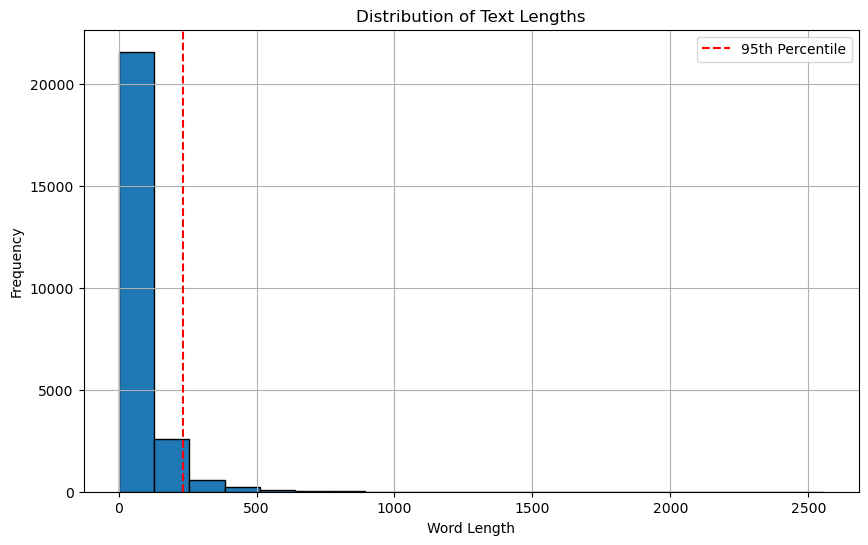

In [211]:
plt.figure(figsize=(10, 6))
plt.hist(text_lengths, bins=20, edgecolor='black')
plt.xlabel('Word Length')
plt.ylabel('Frequency')
plt.title('Distribution of Text Lengths')

# Adding a vertical line for the 95th quartile
quartile_95 = np.percentile(text_lengths, 95)
plt.axvline(x=quartile_95, color='red', linestyle='--', label='95th Percentile')
plt.legend()

plt.grid(True)
plt.show()

# Sentiment Analysis

In [212]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [213]:
sa = SentimentIntensityAnalyzer()

In [214]:
def get_sentiment(clean_text):
    scores = sa.polarity_scores(clean_text)
    return scores['compound']

In [215]:
df['Sentiment Score'] = df['Tokenized Text'].apply(lambda x: get_sentiment(' '.join(x)))

In [216]:
df['Sentiment'] = df['Sentiment Score'].apply(lambda score: 1 if score >= 0 else 0)

In [217]:
pd.set_option('display.max_colwidth', None)
print(df[['Tokenized Text', 'Sentiment Score', 'Sentiment', 'Label']])

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  Tokenized Text  \
0                                                                                                                                                                                                                                                   

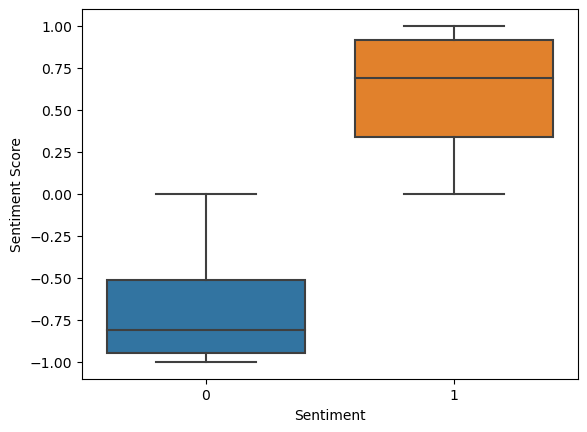

In [218]:
sentiment_col = 'Sentiment'
sns.boxplot(x=sentiment_col, y='Sentiment Score', data=df)
plt.show()

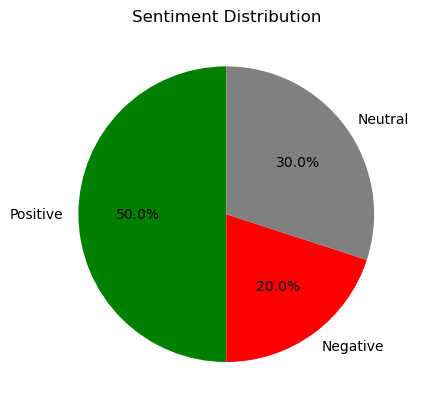

In [219]:
# Example data (replace with your sentiment analysis results)
sentiments = ['Positive', 'Negative', 'Neutral']
counts = [50, 20, 30]

# Plot a pie chart
plt.pie(counts, labels=sentiments, autopct='%1.1f%%', startangle=90, colors=['green', 'red', 'gray'])
plt.title('Sentiment Distribution')
plt.show()

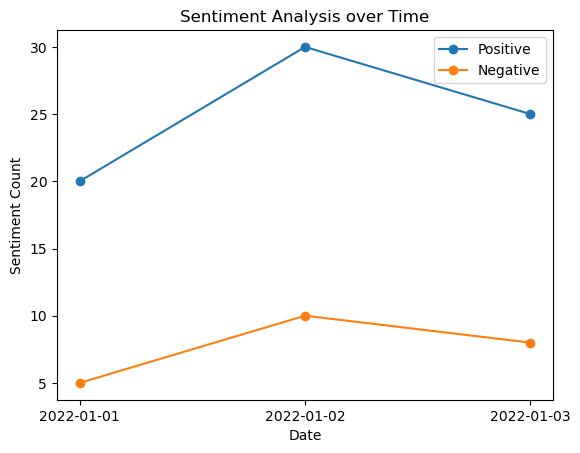

In [220]:
# Example data (replace with your sentiment analysis results)
dates = ['2022-01-01', '2022-01-02', '2022-01-03']
positive_counts = [20, 30, 25]
negative_counts = [5, 10, 8]

# Create a DataFrame
df = pd.DataFrame({'Date': dates, 'Positive': positive_counts, 'Negative': negative_counts})

# Plot a line chart
plt.plot(df['Date'], df['Positive'], label='Positive', marker='o')
plt.plot(df['Date'], df['Negative'], label='Negative', marker='o')
plt.xlabel('Date')
plt.ylabel('Sentiment Count')
plt.title('Sentiment Analysis over Time')
plt.legend()
plt.show()